In [ ]:
import numpy as np
import pandas as pd
import os
import cv2
import tensorflow as tf
from keras.models import Sequential
from keras.layers import Dense, Conv2D, Flatten, MaxPool2D, Dropout, BatchNormalization
from keras.layers import AveragePooling2D
from keras.callbacks import EarlyStopping, ReduceLROnPlateau
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import VGG16
from tensorflow.keras import layers

In [ ]:
# Directory setup
data_dir = r'/content/drive/MyDrive/Mpox'

if not os.path.exists(data_dir):
    print(f"FATAL ERROR: The directory '{data_dir}' was not found. Please check your path.")
    exit()

file_directory = os.listdir(data_dir)
images_file = []
labels_of_img = []
valid_extensions = ['png', 'jpg', 'jpeg']
expected_dirs = ['Monkeypox', 'Normal', 'Others']
found_expected = [d for d in file_directory if d in expected_dirs]

if not found_expected:
    print(f"WARNING: No expected subdirectories ({', '.join(expected_dirs)}) found in {data_dir}.")
    print("Ensure 'Monkeypox', 'Normal', and 'Others' are directly inside the 'Mpox' folder.")

In [ ]:
# Loading the images and labels
for directory in found_expected:
    full_dir_path = os.path.join(data_dir, directory)
    if os.path.isdir(full_dir_path):
        try:
            image_paths = os.listdir(full_dir_path)
            for img_name in image_paths:
                extension = img_name.split('.')[-1].lower()
                if extension in valid_extensions:
                    images_file.append(os.path.join(full_dir_path, img_name))
                    labels_of_img.append(directory)
        except Exception as e:
            print(f"Error listing files in {full_dir_path}: {e}")

dataframe = {"images": images_file, "labels": labels_of_img}
data = pd.DataFrame(dataframe)

if data.empty:
    print("\nFATAL ERROR: DataFrame is empty. No image paths were collected.")
    exit()

In [ ]:
# Model Summary
import pandas as pd
import numpy as np
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications.vgg16 import VGG16, preprocess_input
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Dropout, Input
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
from sklearn.model_selection import train_test_split

train_df, test_df = train_test_split(
    data,
    test_size=0.2,
    random_state=42,
    stratify=data['labels']
)

datagen_train = ImageDataGenerator(
    preprocessing_function=preprocess_input,
    rotation_range=20,
    zoom_range=0.15,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.15,
    horizontal_flip=True,
    fill_mode="nearest"
)

datagen_test = ImageDataGenerator(
    preprocessing_function=preprocess_input
)

train_generator = datagen_train.flow_from_dataframe(
    train_df,
    x_col="images",
    y_col="labels",
    target_size=(224, 224),
    batch_size=32,
    class_mode="categorical",
    shuffle=True
)

test_generator = datagen_test.flow_from_dataframe(
    test_df,
    x_col="images",
    y_col="labels",
    target_size=(224, 224),
    batch_size=32,
    class_mode="categorical",
    shuffle=False
)
# 3. MODEL ARCHITECTURE
base_model = VGG16(weights='imagenet', include_top=False, input_shape=(224, 224, 3))
base_model.trainable = False

inputs = base_model.input
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(512, activation='relu')(x)
x = Dropout(0.4)(x)
outputs = Dense(len(train_generator.class_indices), activation='softmax')(x)

model = Model(inputs, outputs)

model.compile(
    loss="categorical_crossentropy",
    optimizer=tf.keras.optimizers.Adam(learning_rate=0.0005),
    metrics=["accuracy"]
)

callbacks_list = [
    EarlyStopping(monitor="val_loss", patience=8, restore_best_weights=True),
    ReduceLROnPlateau(monitor="val_loss", factor=0.5, patience=3, min_lr=1e-6),
]

history = model.fit(
    train_generator,
    epochs=30,
    validation_data=test_generator,
    callbacks=callbacks_list,
    verbose=1
)

model.save("custom_monkeypox_model.h5")
print("Training Complete. Classes:", list(train_generator.class_indices.keys()))


loss, accuracy = model.evaluate(test_generator, verbose=1)
print(f"Test Loss: {loss:.4f}")
print(f"Test Accuracy: {accuracy:.4f}")


Found 615 validated image filenames belonging to 3 classes.
Found 154 validated image filenames belonging to 3 classes.
58889256/58889256 ━━━━━━━━━━━━━━━━━━━━ 2s 0us/step


/usr/local/lib/python3.12/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/30
20/20 ━━━━━━━━━━━━━━━━━━━━ 266s 13s/step - accuracy: 0.6264 - loss: 1.6170 - val_accuracy: 0.8247 - val_loss: 0.7251 - learning_rate: 5.0000e-04
Epoch 2/30
20/20 ━━━━━━━━━━━━━━━━━━━━ 13s 647ms/step - accuracy: 0.7719 - loss: 0.9278 - val_accuracy: 0.8377 - val_loss: 0.5870 - learning_rate: 5.0000e-04
Epoch 3/30
20/20 ━━━━━━━━━━━━━━━━━━━━ 13s 640ms/step - accuracy: 0.7912 - loss: 0.6472 - val_accuracy: 0.8506 - val_loss: 0.5169 - learning_rate: 5.0000e-04
Epoch 4/30
20/20 ━━━━━━━━━━━━━━━━━━━━ 13s 672ms/step - accuracy: 0.9001 - loss: 0.3309 - val_accuracy: 0.8312 - val_loss: 0.5315 - learning_rate: 5.0000e-04
Epoch 5/30
20/20 ━━━━━━━━━━━━━━━━━━━━ 13s 641ms/step - accuracy: 0.8898 - loss: 0.3718 - val_accuracy: 0.8636 - val_loss: 0.4717 - learning_rate: 5.0000e-04
Epoch 6/30
20/20 ━━━━━━━━━━━━━━━━━━━━ 13s 642ms/step - accuracy: 0.8981 - loss: 0.3042 - val_accuracy: 0.8571 - val_loss: 0.4306 - learning_rate: 5.0000e-04
Epoch 7/30
20/20 ━━━━━━━━━━━━━━━━━━━━ 13s 636ms/step - accu

Training Complete. Classes: ['Monkeypox', 'Normal', 'Others']
5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 185ms/step - accuracy: 0.8434 - loss: 0.3892
Test Loss: 0.4306
Test Accuracy: 0.8571


In [ ]:
model.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv1 (Conv2D)           │ (None, 224, 224, 64)   │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2 (Conv2D)           │ (None, 224, 224, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_pool (MaxPooling2D)      │ (None, 112, 112, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1 (Conv2D)           │ (None, 112, 112, 128)  │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv2 (Conv2D)           │ (None, 112, 112, 128)  │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_pool (MaxPooling2D)      │ (None, 56, 56, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv1 (Conv2D)           │ (None, 56, 56, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv2 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv3 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_pool (MaxPooling2D)      │ (None, 28, 28, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv1 (Conv2D)           │ (None, 28, 28, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv2 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv3 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_pool (MaxPooling2D)      │ (None, 14, 14, 512)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv1 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv2 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv3 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_pool (MaxPooling2D)      │ (None, 7, 7, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 512)            │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 512)            │       262,656 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 3)              │         1,539 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 15,507,275 (59.16 MB)

 Trainable params: 264,195 (1.01 MB)

 Non-trainable params: 14,714,688 (56.13 MB)

 Optimizer params: 528,392 (2.02 MB)

Generating predictions...
5/5 ━━━━━━━━━━━━━━━━━━━━ 2s 330ms/step

CLASSIFICATION REPORT
              precision    recall  f1-score   support

   Monkeypox       0.87      0.82      0.84        56
      Normal       0.92      0.92      0.92        59
      Others       0.76      0.82      0.79        39

    accuracy                           0.86       154
   macro avg       0.85      0.85      0.85       154
weighted avg       0.86      0.86      0.86       154



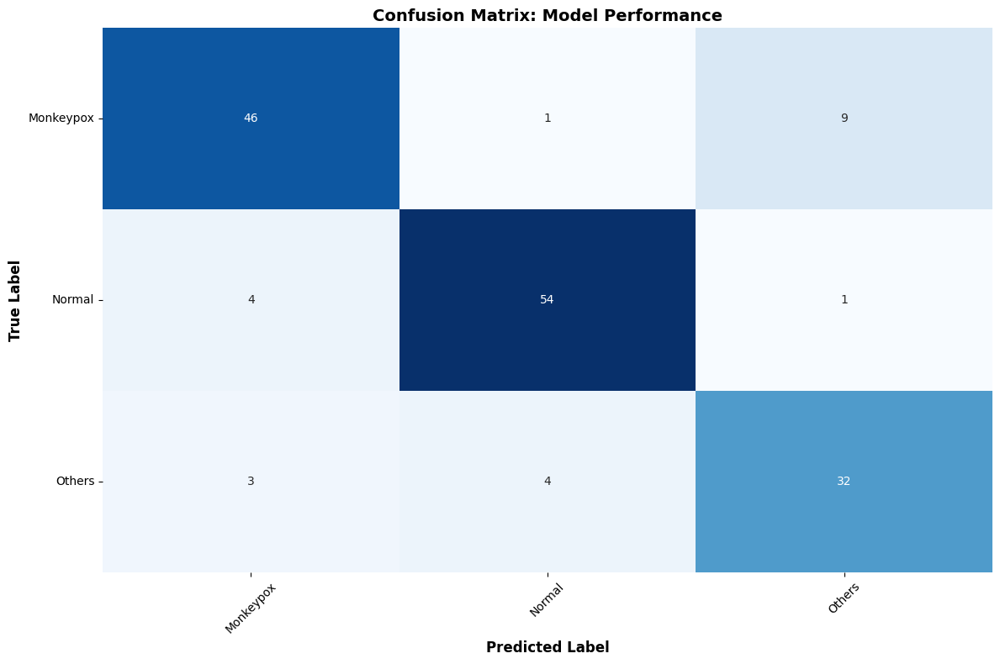

In [ ]:
# Confusion Matrix and Classification Report
import seaborn as sns
from sklearn.metrics import classification_report, confusion_matrix
test_generator.reset()

print("Generating predictions...")
Y_pred_raw = model.predict(test_generator, verbose=1)

# Convert probabilities to Class Indices (e.g., [0, 1, 2])
Y_pred = np.argmax(Y_pred_raw, axis=1)

y_true = test_generator.classes

class_indices = test_generator.class_indices
class_names = list(class_indices.keys())

print("\n" + "="*50)
print("CLASSIFICATION REPORT")
print("="*50)
report = classification_report(y_true, Y_pred, target_names=class_names)
print(report)

# CONFUSION MATRIX
cm = confusion_matrix(y_true, Y_pred)

plt.figure(figsize=(12, 8))
sns.heatmap(
    cm,
    annot=True,
    fmt='g',
    cmap='Blues',
    cbar=False,
    xticklabels=class_names,
    yticklabels=class_names
)

plt.xlabel("Predicted Label", fontsize=12, fontweight='bold')
plt.ylabel("True Label", fontsize=12, fontweight='bold')
plt.title("Confusion Matrix: Model Performance", fontsize=14, fontweight='bold')
plt.xticks(rotation=45)
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()


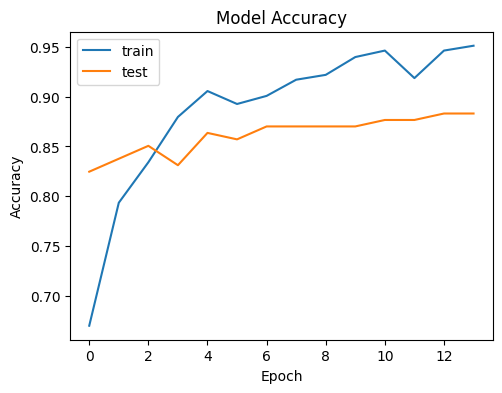

In [ ]:
# Plotting History (Accuracy and Loss)

plt.figure(figsize=(12, 4))

plt.subplot(1, 2, 1)

plt.plot(history.history['accuracy'], label='train')

plt.plot(history.history['val_accuracy'], label='test')

plt.title('Model Accuracy')

plt.ylabel('Accuracy')

plt.xlabel('Epoch')

plt.legend()

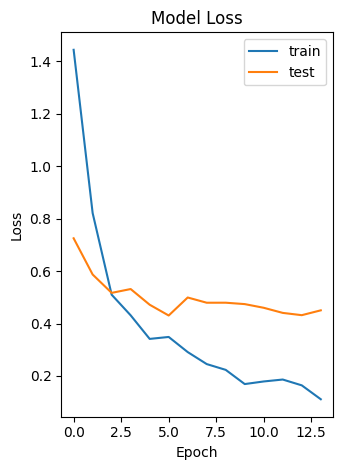

In [ ]:
plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='train')
plt.plot(history.history['val_loss'], label='test')
plt.title('Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend()
plt.tight_layout()
plt.show()

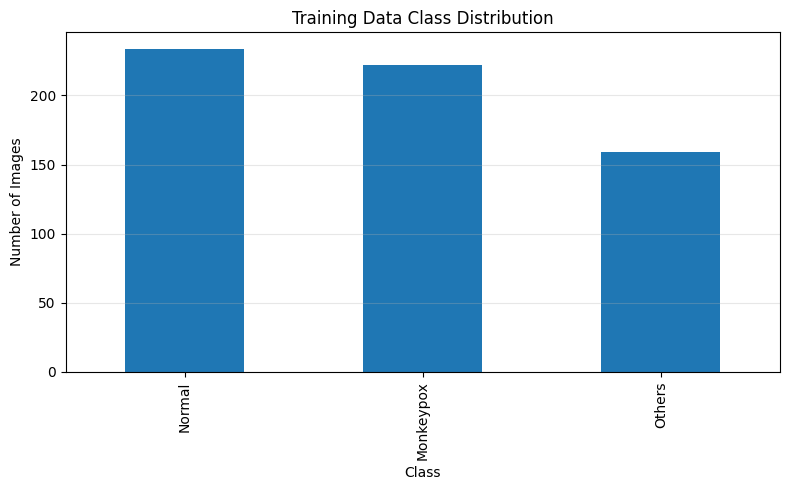

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(8,5))
# Histogram of class distribution
train_df['labels'].value_counts().plot(kind='bar')

plt.title('Training Data Class Distribution')
plt.xlabel('Class')
plt.ylabel('Number of Images')
plt.grid(axis='y', alpha=0.3)

plt.tight_layout()
plt.show()


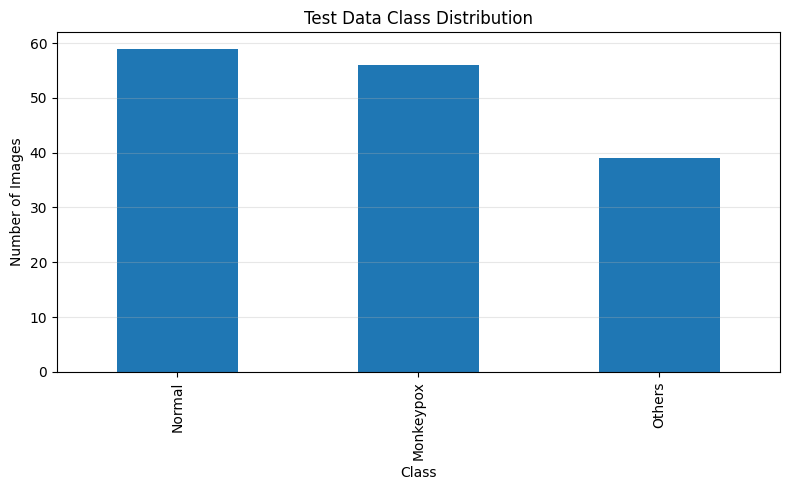

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(8,5))

# Histogram of class distribution in test data
test_df['labels'].value_counts().plot(kind='bar')

plt.title('Test Data Class Distribution')
plt.xlabel('Class')
plt.ylabel('Number of Images')
plt.grid(axis='y', alpha=0.3)

plt.tight_layout()
plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
✅ Predicted: Monkeypox (1.00)


/usr/local/lib/python3.12/dist-packages/keras/src/models/functional.py:241: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: ['input_layer']
Received: inputs=Tensor(shape=(1, 224, 224, 3))
  warnings.warn(msg)


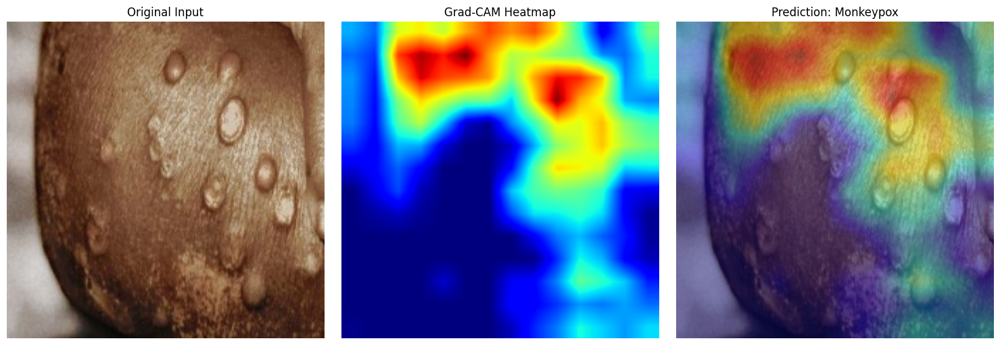

In [ ]:
import cv2
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
from tensorflow.keras.models import load_model, Model

CLASSES = ['Monkeypox', 'Normal', 'Others']
IMG_SIZE = 224
IMG_PATH = "/content/drive/MyDrive/Mpox/Monkeypox/monkeypox1.png"

model = load_model('custom_monkeypox_model.h5')

last_conv_layer_name = 'block5_conv3'
last_conv_layer = model.get_layer(last_conv_layer_name)
img_bgr = cv2.imread(IMG_PATH)
img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
img_resized = cv2.resize(img_rgb, (IMG_SIZE, IMG_SIZE))

x = tf.keras.applications.vgg16.preprocess_input(np.expand_dims(img_resized.copy(), axis=0))

preds = model.predict(x)
pred_idx = np.argmax(preds[0])
pred_class = CLASSES[pred_idx]
print(f"✅ Predicted: {pred_class} ({preds[0][pred_idx]:.2f})")

grad_model = Model(
    inputs=model.input,
    outputs=[last_conv_layer.output, model.output]
)

with tf.GradientTape() as tape:

    conv_outputs, predictions = grad_model(x)
    loss = predictions[:, pred_idx]

# Extract gradients
grads = tape.gradient(loss, conv_outputs)
pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))
conv_outputs = conv_outputs[0]
heatmap = conv_outputs @ pooled_grads[..., tf.newaxis]
heatmap = tf.squeeze(heatmap)
heatmap = tf.maximum(heatmap, 0) / tf.math.reduce_max(heatmap)
heatmap = heatmap.numpy()
heatmap_resized = cv2.resize(heatmap, (IMG_SIZE, IMG_SIZE))
heatmap_8bit = np.uint8(255 * heatmap_resized)
heatmap_color = cv2.applyColorMap(heatmap_8bit, cv2.COLORMAP_JET)
heatmap_color = cv2.cvtColor(heatmap_color, cv2.COLOR_BGR2RGB)
superimposed = cv2.addWeighted(img_resized, 0.6, heatmap_color, 0.4, 0)

plt.figure(figsize=(15, 5))
plt.subplot(1, 3, 1)
plt.imshow(img_resized)
plt.title("Original Input")
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(heatmap_resized, cmap='jet')
plt.title("Grad-CAM Heatmap")
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(superimposed)
plt.title(f"Prediction: {pred_class}")
plt.axis('off')

plt.tight_layout()
plt.show()

Analyzing Predictions for Ranking...
4/5 ━━━━━━━━━━━━━━━━━━━━ 0s 273ms/step

5/5 ━━━━━━━━━━━━━━━━━━━━ 4s 523ms/step

>>> Generating Visualization for: TOP 10 ACCURATE (BEST) <<<



/usr/local/lib/python3.12/dist-packages/keras/src/models/functional.py:241: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: [['input_layer']]
Received: inputs=Tensor(shape=(1, 224, 224, 3))
  warnings.warn(msg)


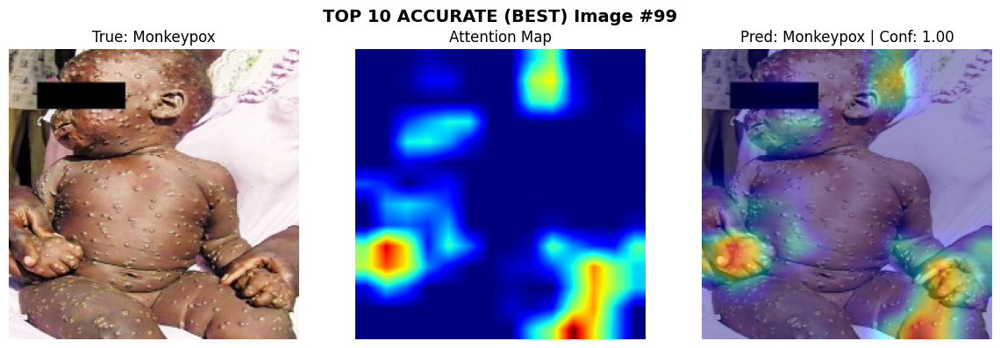

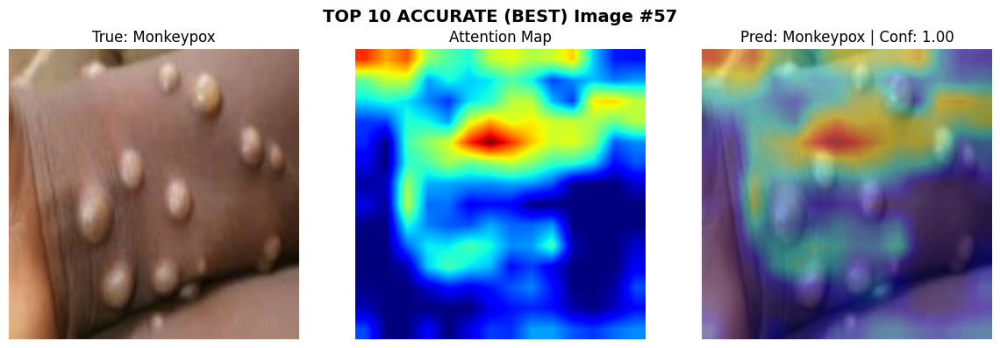

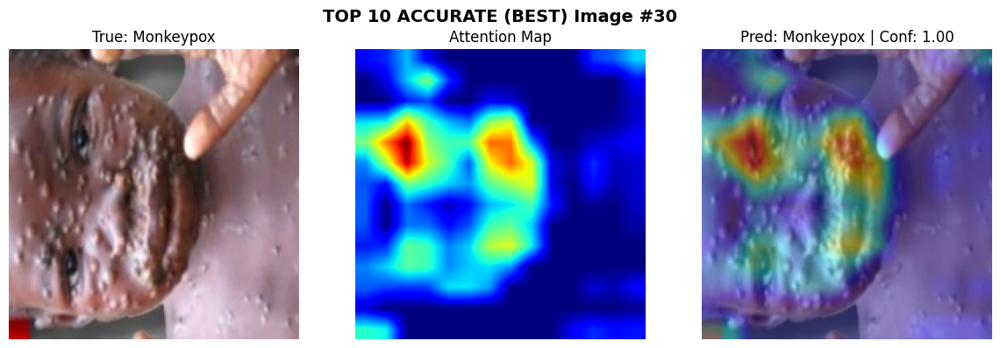

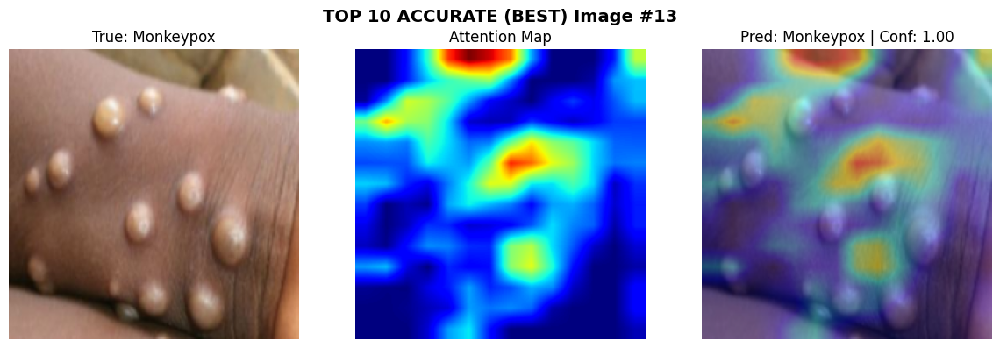

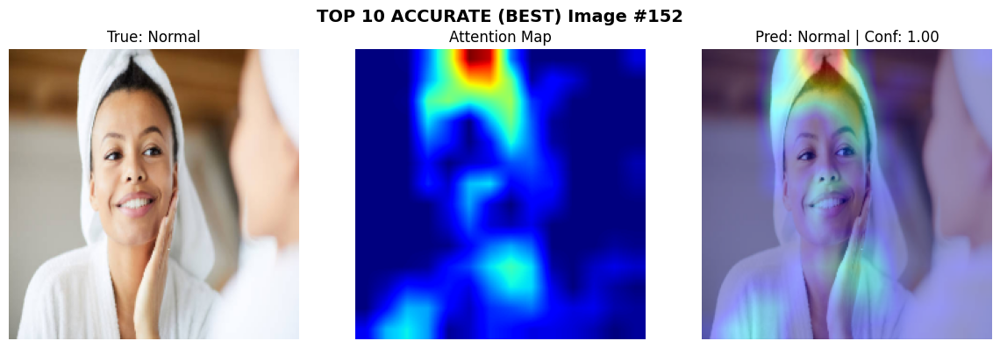

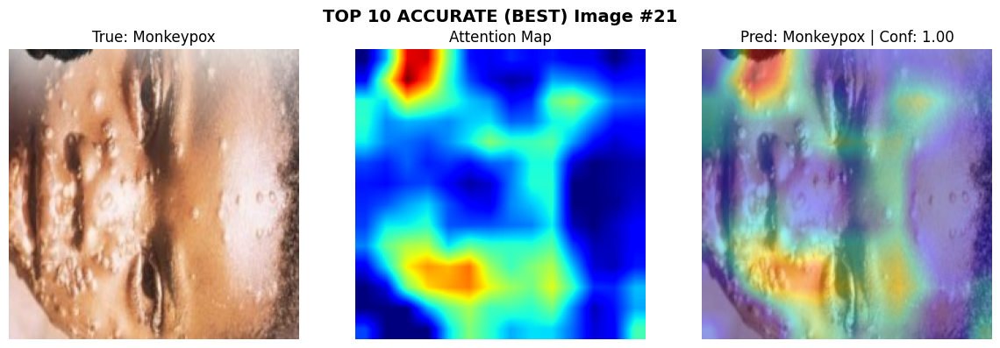

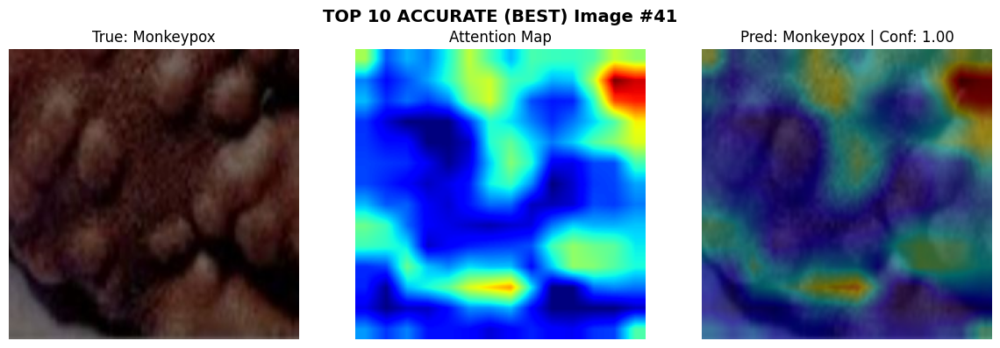

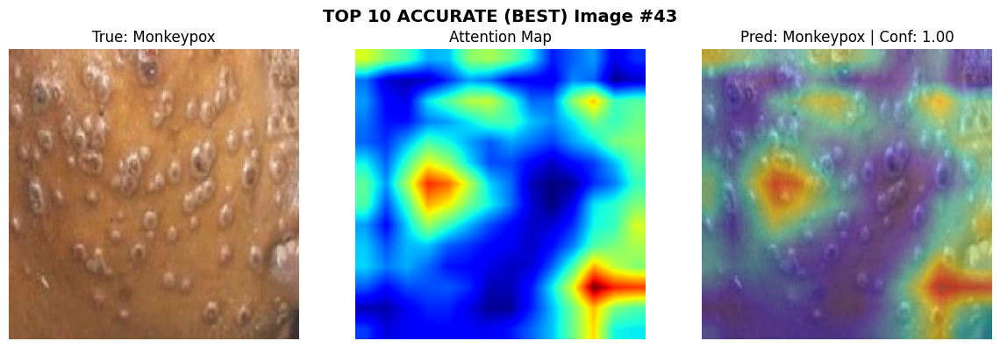

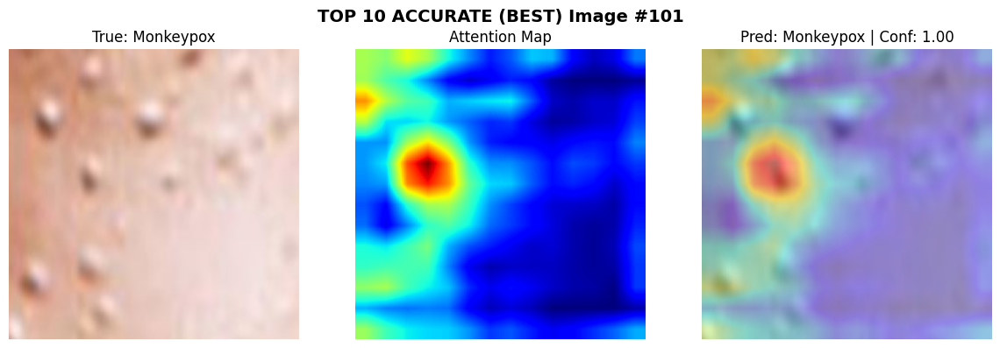

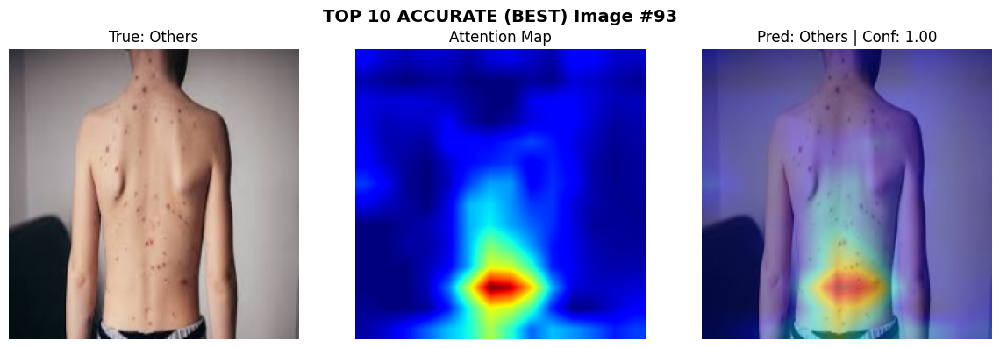




>>> Generating Visualization for: TOP 10 WRONG (WORST) <<<



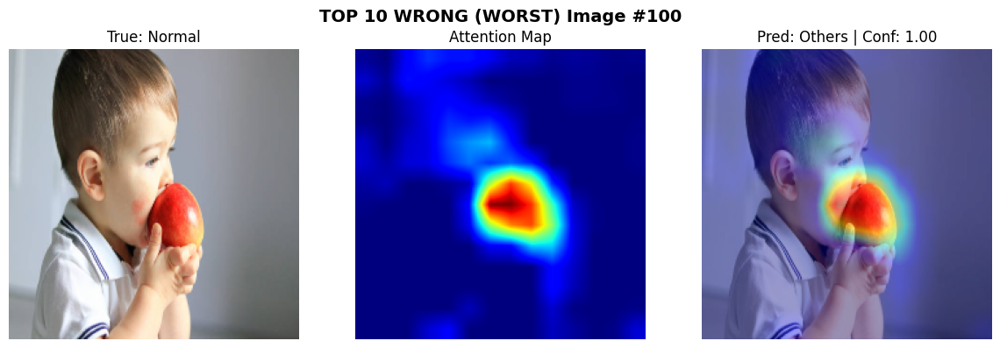

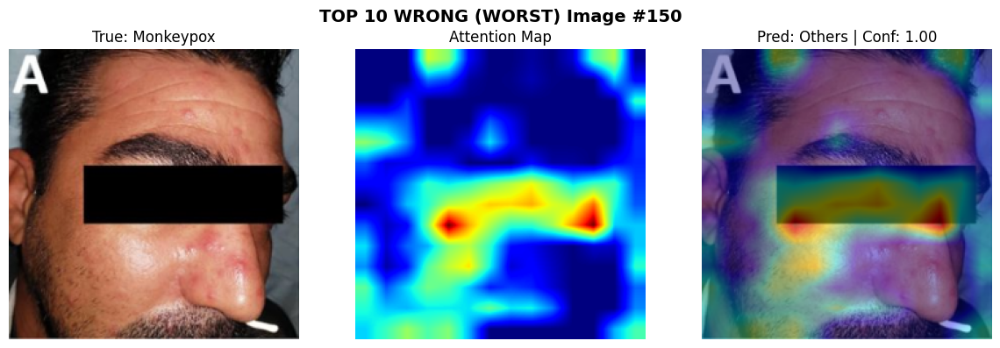

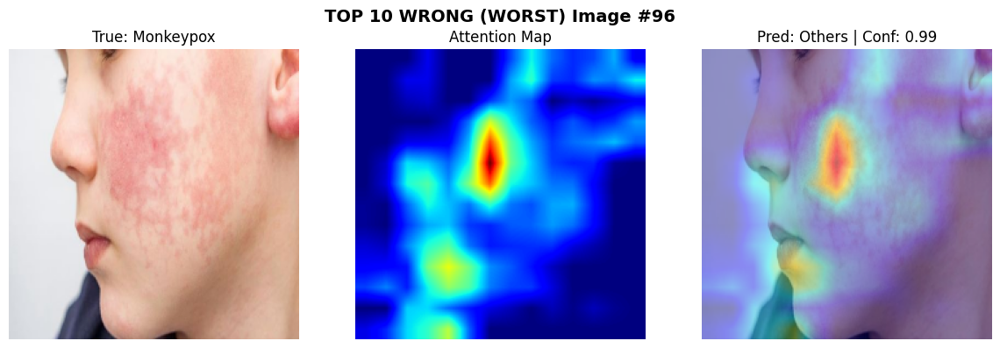

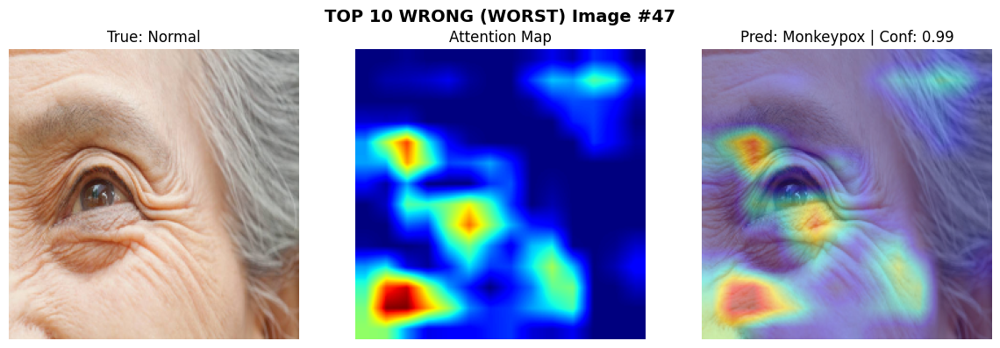

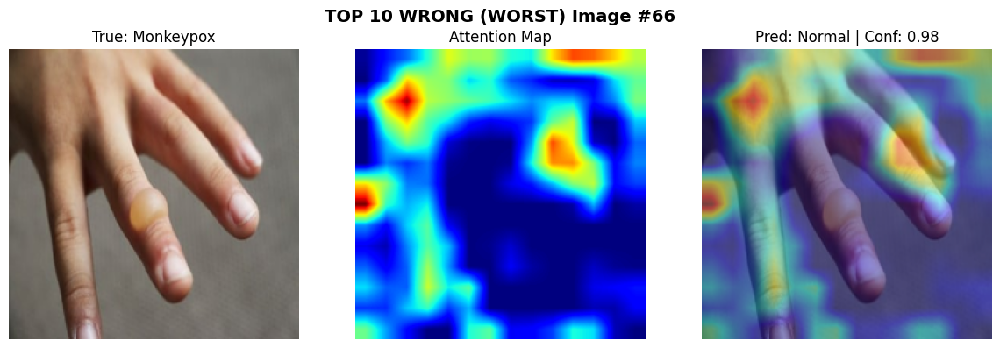

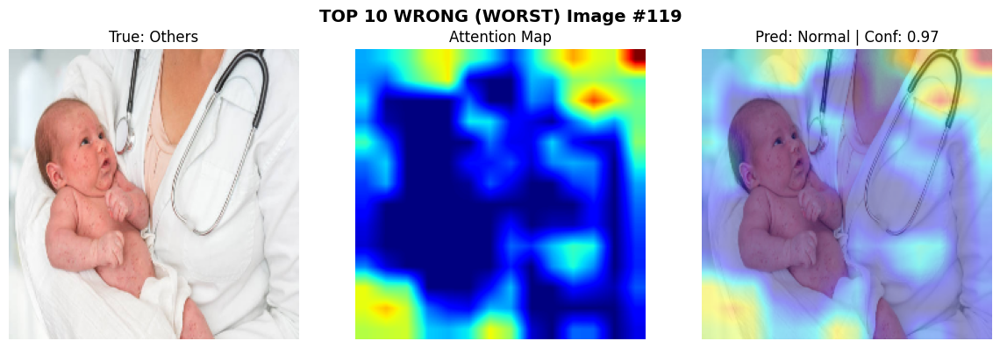

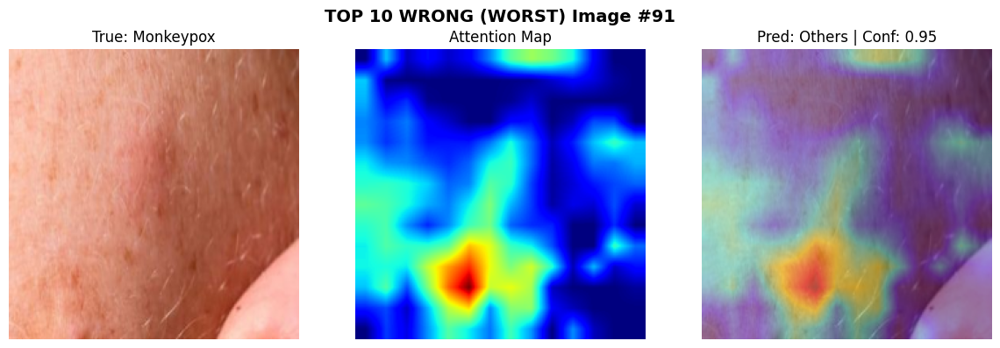

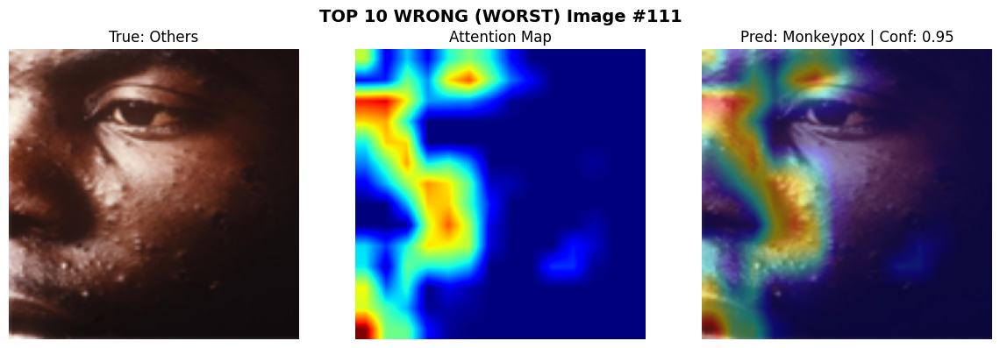

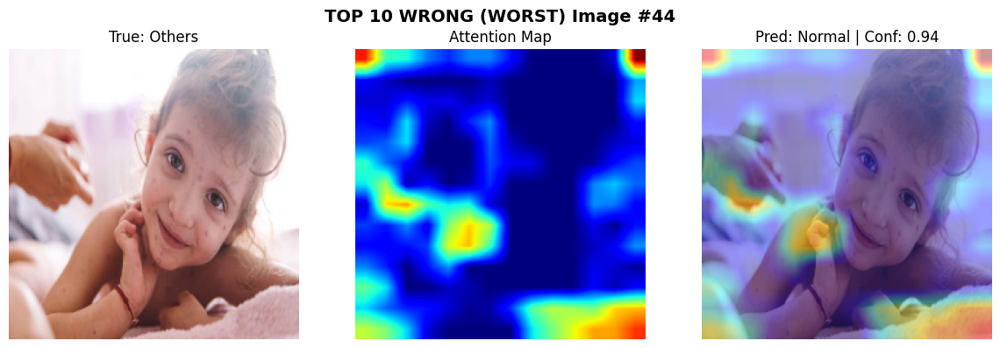

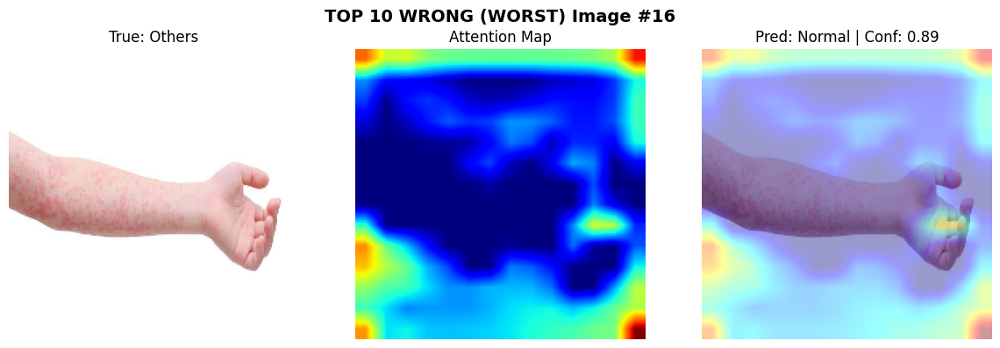

In [ ]:
import pandas as pd
import numpy as np
import tensorflow as tf
import cv2
import matplotlib.pyplot as plt
from tensorflow.keras.models import Model

last_conv_layer_name = 'block5_conv3'
CLASSES = list(test_generator.class_indices.keys())

def get_gradcam_heatmap(model, img_array, last_conv_layer_name):
    grad_model = Model(
        inputs=[model.inputs],
        outputs=[model.get_layer(last_conv_layer_name).output, model.output]
    )

    with tf.GradientTape() as tape:
        last_conv_layer_output, preds = grad_model(img_array)
        pred_index = tf.argmax(preds[0])
        class_channel = preds[:, pred_index]

    grads = tape.gradient(class_channel, last_conv_layer_output)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))
    last_conv_layer_output = last_conv_layer_output[0]
    heatmap = last_conv_layer_output @ pooled_grads[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)
    heatmap = tf.maximum(heatmap, 0) / tf.math.reduce_max(heatmap)
    return heatmap.numpy()

def visualize_batch(df_subset, title_type):
    print(f"\n>>> Generating Visualization for: {title_type} <<<\n")

    for idx, row in df_subset.iterrows():
        img_path = row['img_path']
        true_label = row['true_label']
        pred_label = row['pred_label']
        conf = row['confidence']

        try:
            img_bgr = cv2.imread(img_path)
            if img_bgr is None: continue

            img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
            img_resized = cv2.resize(img_rgb, (224, 224))
            x = tf.keras.applications.vgg16.preprocess_input(np.expand_dims(img_resized.copy(), axis=0))


            heatmap = get_gradcam_heatmap(model, x, last_conv_layer_name)

            heatmap_resized = cv2.resize(heatmap, (224, 224))
            heatmap_8bit = np.uint8(255 * heatmap_resized)
            heatmap_color = cv2.applyColorMap(heatmap_8bit, cv2.COLORMAP_JET)
            heatmap_color = cv2.cvtColor(heatmap_color, cv2.COLOR_BGR2RGB)

            superimposed = cv2.addWeighted(img_resized, 0.6, heatmap_color, 0.4, 0)

            plt.figure(figsize=(12, 4))

            plt.subplot(1, 3, 1)
            plt.imshow(img_resized)
            plt.title(f"True: {true_label}")
            plt.axis('off')

            plt.subplot(1, 3, 2)
            plt.imshow(heatmap_resized, cmap='jet')
            plt.title("Attention Map")
            plt.axis('off')

            plt.subplot(1, 3, 3)
            plt.imshow(superimposed)
            plt.title(f"Pred: {pred_label} | Conf: {conf:.2f}")
            plt.axis('off')

            plt.suptitle(f"{title_type} Image #{idx+1}", fontsize=14, fontweight='bold')
            plt.tight_layout()
            plt.show()

        except Exception as e:
            print(f"Error processing image: {e}")

print("Analyzing Predictions for Ranking...")

test_generator.reset()
Y_pred_raw = model.predict(test_generator, verbose=1)
Y_pred_indices = np.argmax(Y_pred_raw, axis=1)
y_true_indices = test_generator.classes

results = []
filenames = test_generator.filenames

for i in range(len(filenames)):
    img_path = test_df.iloc[i]['images']

    true_lbl = CLASSES[y_true_indices[i]]
    pred_lbl = CLASSES[Y_pred_indices[i]]
    confidence = np.max(Y_pred_raw[i])
    is_correct = (y_true_indices[i] == Y_pred_indices[i])

    results.append({
        'img_path': img_path,
        'true_label': true_lbl,
        'pred_label': pred_lbl,
        'confidence': confidence,
        'is_correct': is_correct
    })

results_df = pd.DataFrame(results)
top_correct = results_df[results_df['is_correct'] == True].sort_values(by='confidence', ascending=False).head(10)

top_wrong = results_df[results_df['is_correct'] == False].sort_values(by='confidence', ascending=False).head(10)

visualize_batch(top_correct, "TOP 10 ACCURATE (BEST)")

print("\n" + "="*50 + "\n")

visualize_batch(top_wrong, "TOP 10 WRONG (WORST)")